<a href="https://colab.research.google.com/github/jessicasalazar/Optimization/blob/main/20250617_Final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="text-align: left;">
    <div style="color: grey; font-size: 11px;">Universidad EAFIT</div>
</div>

<h1 style="text-align: center;">LOCALIZACIÓN DE 11 EDIFICIOS DE CARGA PARA BUSES ELÉCTRICOS EN MEDELLÍN</h1>

#### Nombre: Jessica Salazar Vásquez
#### Profesor: Juan Carlos Duque

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Preguntas clave de investigación para los modelos de Location:

1. **Cuántas facilities deben ser ubicadas?**
* 11 centros para prestar servicios de carga a buses eléctricos.

2. **Cuáles son los factores relevantes para ubicar cada facility?**
* Las facilities deberían estar ubicadas muy cerca de los nodos de inicio o los nodos de finalización de las rutas de buses para evitar kilometros de recorrido vacío.
* Es preferible estar cerca a las estaciones del metro.
* Capturar la mayor demanda posible en todas las facilities.

2. **Dónde se debería ubicar cada facility?**
* En la ciudad de Medellín o los municipos vecinos del Valle de Aburrá.

3. **Qué tan grande debería ser cada facility?**
* 200 vehículos por edificio,14 buses por piso. Se debe tener en cuenta las dimensiones de cada vehículo, como se muestra la siguiente imagen.
* Esta información es irrelevante para este modelo de optimización.

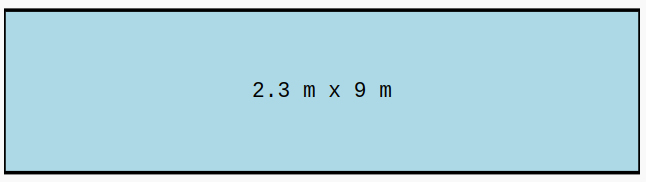


# OBJETIVO GENERAL

Ubicar 11 edificios (facilities) para prestar servicios de carga de energía a buses eléctricos (demanda) en la ciudad de Medellín, teniendo en cuenta las barreras geograficas entre la ubicación de la facility y los recorridos de los buses que demandan el servicio de carga eléctrica.



# OBJETIVOS ESPECÍFICOS

- Ubicar 11 facilities que maximicen la demanda en un área de cobertura específica, donde un nodo de demanda puede ser satisfecho por una única facility.

- Asumir que los costos o los beneficios de construir una facility no influyen en la selección de un óptimo local para localizar una facility.

- Usar diferentes métricas de distancia geográficas entre las facilities y la demanda.

- Mapear el resultado de los óptimos locales que localizan los 11 centros de carga.

- Comparar los resultados y seleccionar el reultado que minimiza la función.

# METODOLOGÍA

La metodología diseñada para ubicar 11 facilities se muestra en el siguiente diagrama de flujo metodológico, en el cual se muestran cuatro grandes procesos. el primer proceso corresponde a la selección y extracción de datos, el segundo a los procesos espaciales de datos. Por su parte, el tercer proceso corresponde a la construcción de variables específicamente de demanda y de localizaciones candidatas, mientras que en el cuarto proceso es la fase de modelos de optimización y el mapeo comparativo de los resultados.

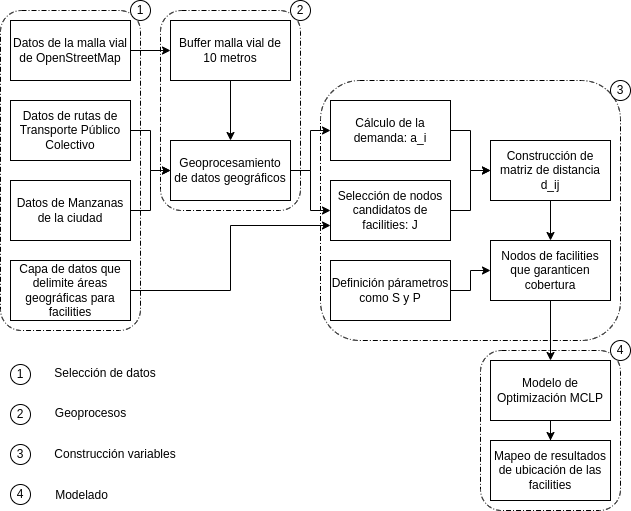

In [2]:
from IPython.display import Image, display
display(Image("/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/images/flujograma_facilities.png"))

# 1. DATOS

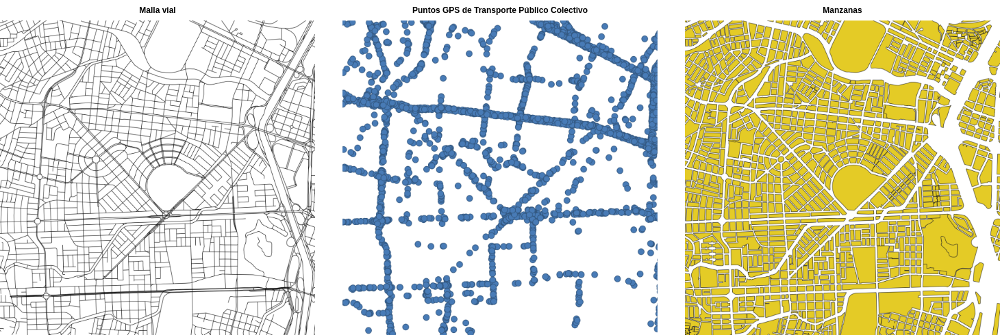

In [3]:
display(Image("/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/images/datos.png"))

# 2. GEOPROCESOS

### Geoproceso para construcción de la Demanda

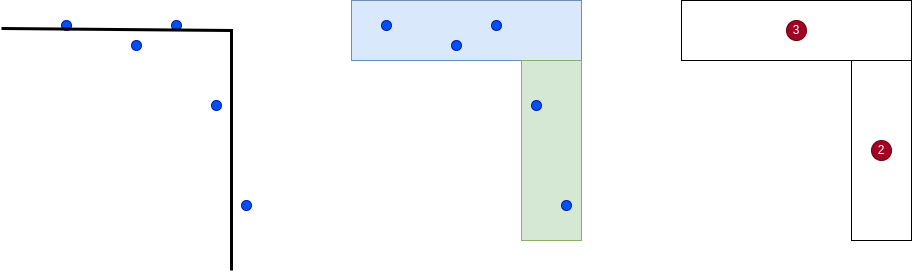

In [4]:
display(Image("/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/images/grafico_dda.png"))

### Geoproceso para selección de nodos candidatos a ubicar una facility

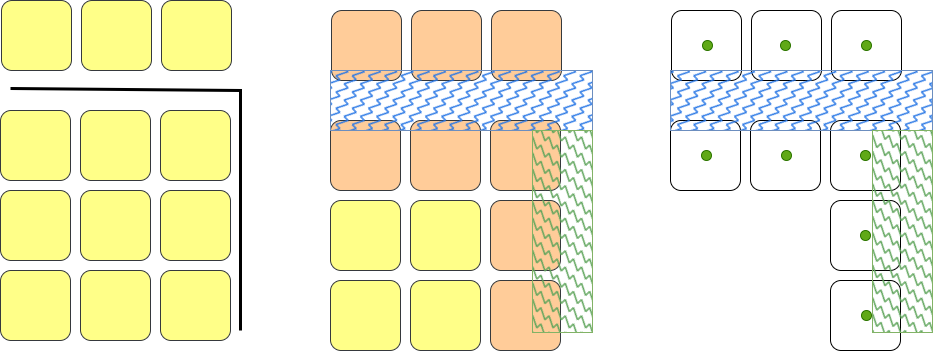

In [5]:
display(Image("/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/images/grafico_manzanas.png"))

# 3. THE MAXIMAL COVERING LOCATION PROBLEM

El Maximal Covering Location Problem busca maximizar la población que puede ser servida dentro de dentro de un área de cobertura de una facility, dado un número limitado de facilities. Una formulación matemática se puede dar de la siguiente manera:

$\max\sum_{i\in I} a_i*y_i$

s.a.

$\sum_{j\in N_i} x_{j} \geq y_{i}  \forall i \in I$

$\sum_{j\in J} x_{j} = P$

$x_{j} = (0,1)  \forall j \in J$

$y_{i} = (0,1)   \forall i \in I$

donde,

$I$ = nodos de demanda.

$J$ = nodos de facilities.

$S$ = área de cobertura.

$d_ij$ = distancia más corta entre el nodo de demanda $i$ y el nodo con facility $j$.

$x_{j} = \left\{ \begin{array}{rcl}1 & sí & una & facility & es & ubicada & en & el & nodo & j \\ 0 & en & otro & caso\end{array}\right.$

$N_i = \{ j \in J | d_ij\leq S \}$

$a_i$ = demanda del nodo $i$.

$p$ = número de facilities a ubicar óptimamente.

$w_j$ = ponderación de los nodos $j$, donde los nodos iniciales y finales de cada ruta tienen mayor peso.

$c_j$ = costo de ubicar una facility en el nodos $j$.

Una formulación al Maximal Covering Location Problem puede ser derivada de:

$1 - \bar{y}_{i} = y_{i}$

$\bar{y}_{i} = \left\{ \begin{array}{rcl}1 & sí & la & demanda & del & nodo & i & no & es & cubierta & por & una & facility & dentro & de & S \\ 0 & en & otro & caso\end{array}\right.$

$\max\sum_{i\in I} a_i*(1 - \bar{y}_{i})$

### Maximal Covering Location Problem - modelo inicial:
La maximización de una cantidad negativa es es equivalente a la minimización de la cantidad positiva. La función objetivo se sobreescribe como sigue:

$\min\sum_{i\in I} a_i*\bar{y}_{i}$

s.a.

$\sum_{j\in N_i} x_{j} + \bar{y}_{i} \geq 1  \forall i \in I$

$\sum_{j\in J} x_{j} = p$

$x_{j} = (0,1)  \forall j \in J$

$\bar{y}_{i} = (0,1)   \forall i \in I$

Esta formulación, busca minimizar la población no cubierta sí $p$ facilities son ubicadas en una red.

### Maximal Covering Location Problem - modelo modificado:

$\min\sum_{i\in I} a_i*\bar{y}_{i} - \lambda\sum_{j\in J}w_j*x_j$

s.a.

$\sum_{j\in N_i} x_{j} + \bar{y}_{i} \geq 1  \forall i \in I$

$\sum_{j\in J} x_{j} = p$

$\sum_{j\in J} c_j*x_{j} = b$

$x_{j} = (0,1)  \forall j \in J$

$\bar{y}_{i} = (0,1)   \forall i \in I$

Esta formulación, busca minimizar la población no cubierta, con $p$ facilities son ubicadas en una red, ponderando por mayor peso a los nodos de inicio y fin de las rutas del TPC y teniendo en cuenta el costo de las ubicaciones candidatas.

# 4. RESULTADOS

## 4.1. DATOS

In [6]:
# ======================================
# CONFIGURACIÓN DEL ENTORNO DE EJECUCIÓN
# ======================================

# Instalar las librerías necesarias
!pip install pyomo
!apt install glpk-utils
!pip install contextily


# Importar librerías
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from operator import index
from scipy.spatial import distance_matrix
from scipy.spatial.distance import cdist
# Importo librerías optimización
from pyomo.environ import *
from pyomo.environ import (
    ConcreteModel, Set, Param, Var, Binary, Constraint, Objective, maximize,
    NonNegativeReals, NonNegativeIntegers, SolverFactory
)
import matplotlib.pyplot as plt
import contextily as ctx
from geopandas import GeoDataFrame
import contextily as ctx
from shapely.geometry import LineString

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libamd2 libcolamd2 libglpk40 libsuitesparseconfig5
Suggested packages:
  libiodbc2-dev
The following NEW packages will be installed:
  glpk-utils libamd2 libcolamd2 libglpk40 libsuitesparseconfig5
0 upgraded, 5 newly installed, 0 to remove and 35 not upgraded.
Need to get 625 kB of archives.
After this operation, 2,158 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libsuitesparseconfig5 amd64 1:5.10.1+dfsg-4build1 [10.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libamd2 amd64 1:5.10.1+dfsg-4build1 [21.6 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libcolamd2 amd64 1:5.10.1+dfsg-4build1 [18.0 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libglpk40 amd64 5.0-1 [361 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/universe amd64 glpk-ut

In [7]:
# =================
# CENSO DE COLOMBIA
# =================

# Abrir el shape file de las manzanas de Colombia
gdf = gpd.read_file('/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/datos/input/censo_estrato/medellin.shp')

# Filtrar las manzanas cuyo código de municipio es Medellín
gdf1 = gdf[gdf['MPIO_CCDGO']=='05001']

# Transformar el SCR a UTM 18ZN
gdf1 = gdf1.to_crs(epsg=32618)

# Borro las manzanas para las cuales no tengo datos de estrato
gdf1.dropna(subset=['estrato_mo'], inplace=True)

In [8]:
# =======================================
# NODOS GPS DE LAS RUTAS DE BUSES DEL TPC
# =======================================

# Abrir el Shape file de los nodos de ruta de TPC de Medellín
gdf2 = gpd.read_file('/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/datos/input/tpc_amva_nodes/tpc_amva_nodes_first.shp')

# Indicarle al geodataframe que el CRS es WGS84
gdf2.crs = "EPSG:4326"

# Transformar el SCR a UTM 18ZN
gdf2 = gdf2.to_crs(epsg=32618)

# Printeo para verificar que esté en el SCR que necesito
print(gdf2.crs)

EPSG:32618


In [9]:
# =============================================================================
# CREACIÓN DE PESOS DE IMPORTANCIA A LOS NODOS TPC DE INICIO Y FIN DE LAS RUTAS
# =============================================================================

# Hago una copia del consecutivo para crear la variable pesos
gdf2['pesos'] = gdf2.consecutiv

# Asigna a 'w' por grupo de 'secuencia' el máximo elemento‐a‐elemento
# entre (max(pesos)+1 – pesos) y (pesos) para cada fila.
gdf2['w'] = gdf2.groupby(['secuencia', 'codigoruta'])['pesos'] \
                .transform(lambda x: np.maximum(x.max() + 1 - x, x))

# Normalización min–max de w en cada secuencia
gdf2['w_norm'] = (
    gdf2.groupby(['secuencia', 'codigoruta'])['w']
        .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

In [10]:
# =============
# RUTAS DEL TPC
# =============

# Abrir el Shape file de los nodos de ruta de TPC de Medellín
gdf2_1 = gpd.read_file('/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/datos/input/tpc_amva_primeras_rutas/tpc_amva_primeras_rutas.shp')

# Indicarle al geodataframe que el CRS es WGS84nodes
gdf2_1.crs = "EPSG:4326"

# Transformar el SCR a UTM 18ZN
gdf2_1 = gdf2_1.to_crs(epsg=32618)

# Imprimir para verificar que esté en el SCR que necesito
print(gdf2_1.crs)

EPSG:32618


In [11]:
# ======================
# MALLA VIAL DE MEDELLÍN
# ======================

# Abrir el shape file de la malla vial de Medellín
gdf3 = gpd.read_file('/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/datos/input/edges_osm/medellin-561_edges.shp')

# Transformar el SCR a UTM 18ZN
gdf3 = gdf3.to_crs(epsg=32618)

# Renombrar variables
gdf3.rename(columns={'ID': 'fid', 'from': 'u',	'to': 'v'}, inplace=True)

<ipython-input-12-2960877805>:29: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


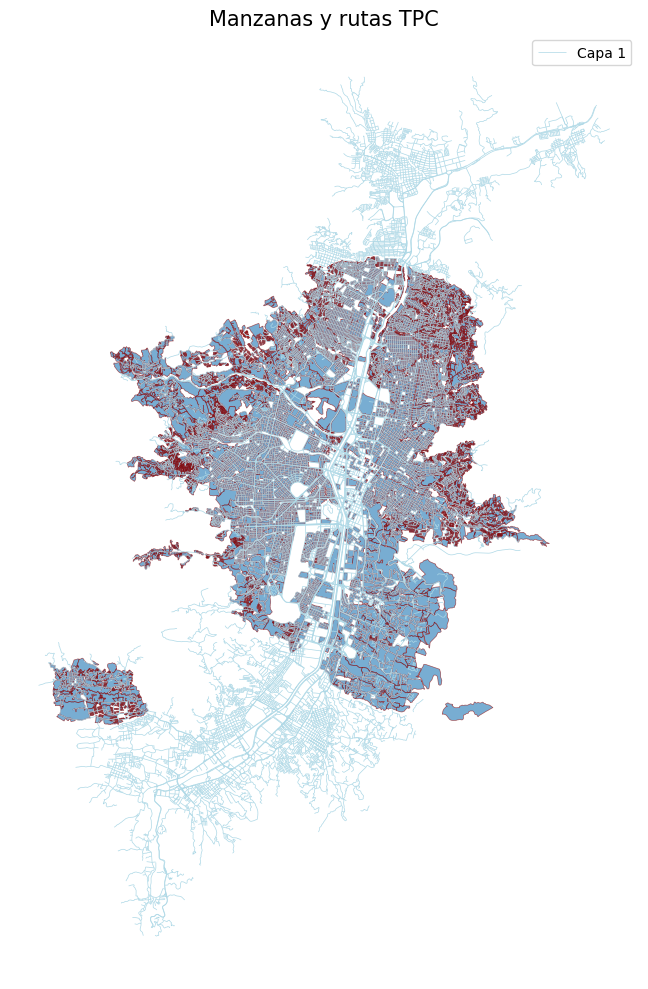

In [12]:
# ====================================================
# MAPA DE LAS MANZANAS DE MEDELLÍN Y LAS RUTAS DEL TPC
# ====================================================

# Mapa
fig, ax = plt.subplots(figsize=(10, 10))

# Capa de manzanas
gdf3.plot(
    ax=ax,
    color="lightblue",
    edgecolor="black",
    linewidth=0.5,
    label="Capa 1"
)

# Capa de nodos de rutas de TPC
gdf1.plot(
    ax=ax,
    alpha=0.6,  # transparencia
    edgecolor="darkred",
    linewidth=0.5,
    label="Capa 2"
)

# Leyenda
ax.set_title("Manzanas y rutas TPC", fontsize=15)
ax.set_axis_off()       # oculto ejes
ax.legend()

# Muestro el mapa
plt.tight_layout()
plt.show()


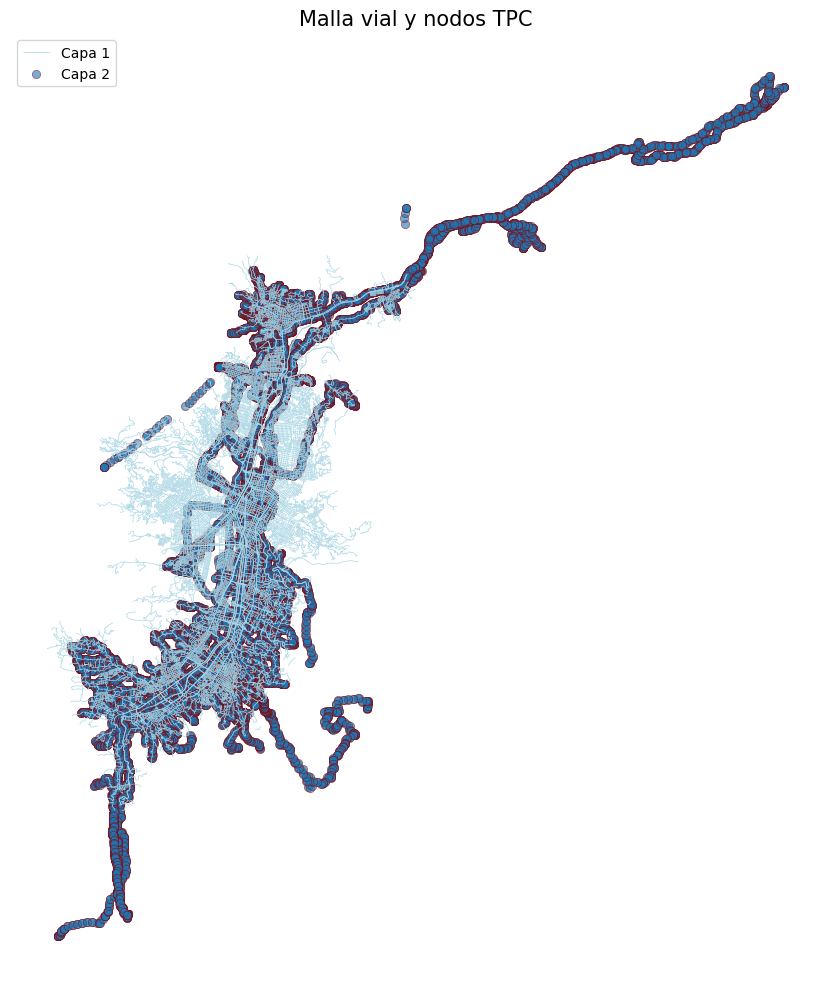

In [13]:
# =====================================================
# MAPA DE LA MALLA VIAL DE MEDELLÍN Y LOS NODOS DEL TPC
# =====================================================

# Mapa
fig, ax = plt.subplots(figsize=(10, 10))

# Capa malla vial
gdf3.plot(
    ax=ax,
    color="lightblue",
    edgecolor="black",
    linewidth=0.5,
    label="Capa 1"
)

# Capa de nodos de GPS de TPC
gdf2.plot(
    ax=ax,
    alpha=0.6,
    edgecolor="darkred",
    linewidth=0.5,
    label="Capa 2"
)

# Leyenda
ax.set_title("Malla vial y nodos TPC", fontsize=15)
ax.set_axis_off()
ax.legend()

# Mostrar el mapa
plt.tight_layout()
plt.show()

## 4.2. GEOPROCESOS

In [14]:
# ======================================
# GENERO BUFFER PARA HACER SPATIAL JOINS
# ======================================

# Genero el buffer a la malla vial de 10 metros
# ---------------------------------------------
gdf3['geometry_buffer'] = gdf3['geometry'].buffer(10)

# Genero un geodataframe con las variables que necesito y con la geometría del buffer (polígono) como variable geometry
gdf4 = gpd.GeoDataFrame(
    gdf3[['fid', 'u', 'v']],
    geometry=gdf3['geometry_buffer'],
    crs = gdf3.crs
)

# Genero el buffer a la red del TPC
# ---------------------------------
gdf2_1['geometry_buffer'] = gdf2_1['geometry'].buffer(10)

# Genero un geodataframe con las variables que necesito y con la geometría del buffer (polígono) como variable geometry
gdf5 = gpd.GeoDataFrame(
    gdf2_1[['secuencia',	'codigoruta', 'descripcio']],
    geometry=gdf2_1['geometry_buffer'],
    crs = gdf2_1.crs
)

In [15]:
# ====================================
# SPATIAL JOINS DE VIAS Y NODOS DE TPC
# ====================================

# Hago un join espacial entre el buffer de vías y los nodos GPS de TPC
gdf_vias = gpd.sjoin(gdf4, gdf2)

# Cuento los nodos GPS de TPC dentro del buffer de cada segmento vial, esta es mi demanda
gdf4.loc[:, "a_i"]= gdf_vias.value_counts("fid")
gdf4["a_i"] = gdf4["a_i"].fillna(0)

# Genero una copia del geodataframe
gdf_a = gdf4.copy()

# Transformo la geometría del geodataframe a los centroides de cada segmento vial -> paso de polígono a punto
centroids = gdf_a.geometry.centroid
gdf_a['geometry'] = centroids

<Axes: >

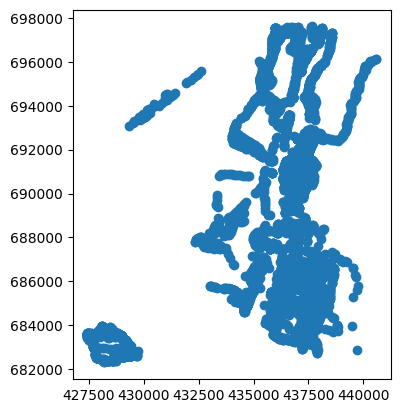

In [16]:
# ================================================
# SPATIAL JOIN DE RUTAS TPC Y MANZANAS DE MEDELLÍN
# ================================================

# Geoproceso que me mantiene las manzanas más próximas a las rutas del TPC
gdf_fac = gdf1.overlay(gdf5, how='intersection')

# Transformo la geometría de poligono a punto usando el centroide
centroids = gdf_fac.geometry.centroid
gdf_fac['geometry'] = centroids

# Mapa resultante de la intersección entre malla vial y manzanas
gdf_fac.plot()

<Axes: >

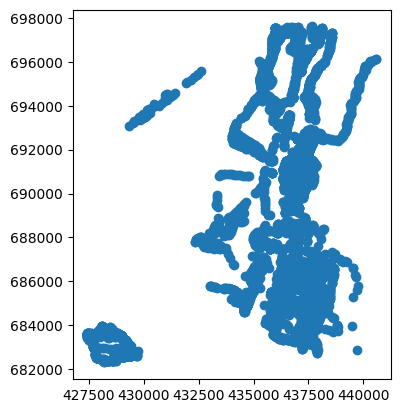

In [17]:
# Mapa de los centroides de las manzanas resultantes
gdf_fac.plot()

In [18]:
# =======================================================================
# SPATIAL JOIN DEL NODO MÁS CERCANO ENTRE DEMANDA Y UBICACIONES FACTIBLES
# =======================================================================

# Vecina mas cercano usando la distancia
gdf_fac = gpd.sjoin_nearest(gdf_fac, gdf2, how='left', distance_col='distance')

# Borro indices repetidos
gdf_fac.drop_duplicates(subset=['MANZ_CCNCT'], inplace=True)

# Cuento cuantos nodos de posibles localizaciones de facility tengo
print(f'Total de ubicaciones factibles: {len(gdf_fac)}')

# Cuento cuantos nodos de demanda tengo
print(f'Total de nodos de demanda: {len(gdf_a)}')

Total de ubicaciones factibles: 1750
Total de nodos de demanda: 33114


In [19]:
# ==============================================
# AREA DE MEDELLÍN CON BAJA PENDIENTE EN LA VÍAS
# ==============================================

# Uso la capa del area ciclable de Medellín como el polígono para delimitar
gdf5 = gpd.read_file('/content/drive/MyDrive/Doctorado/Cursos/Modelos_metodos_optimizacion/Proyecto_final/datos/input/Area_ciclable/MDE_cyclable perimeter.shp')

# Indico el SCR de origen
gdf5.crs = "EPSG:4326"

# Transformo a SCR UTM 18 ZN
gdf5 = gdf5.to_crs(epsg=32618)

# Verifico que el SCR sea el que necesito
print(gdf5.crs)

EPSG:32618


/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D Polygon' is converted to 'Polygon Z'
  return ogr_read(


In [20]:
# ==========================
# DELIMITAR ÁREAS DE ESTUDIO
# ==========================

# Corto el geodataframe de demanda con respecto al área delimitante (yo creo que este no lo debería cortar)
gdf_ar = gpd.clip(gdf_a, gdf5)

# Corto el geodataframe de localizaciones candidatas a facilities con respecto al área delimitante
gdf_facr = gpd.clip(gdf_fac, gdf5)

# Cuento cuantos nodos de posibles localizaciones de facility tengo
print(f'Dimensión de j: {len(gdf_facr)}')

# Cuento cuantos nodos de demanda tengo
print(f'Dimensión de i : {len(gdf_ar)}')

Dimensión de j: 694
Dimensión de i : 9963


<Axes: >

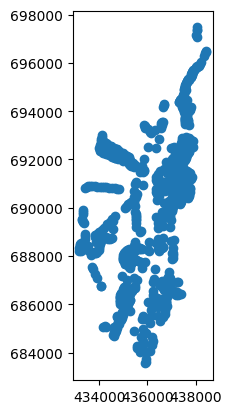

In [21]:
# ==================================
# MAPA DE LAS UBICACIONES CANDIDATAS
# ==================================

# Mapa de los centroides de las manzanas resultantes dentro del área delimitante
gdf_facr.plot()

## 4.3.1. MODELO DE OPTIMIZACIÓN MAXIMAL COVERING LOCATION PROBLEM CON DISTANCIA EUCLIDEA

In [22]:
# ====================
# DISTANCIAS EUCLIDEAS
# ====================
# Construyo la matriz de distancias entre los nodos de demanda y los nodos candidatos
ar_coords   = np.vstack([gdf_ar.geometry.x,   gdf_ar.geometry.y]).T   # (N_ar, 2)
facr_coords = np.vstack([gdf_facr.geometry.x, gdf_facr.geometry.y]).T # (N_facr, 2)

# dist_matrix[i, j] = distancia entre ar_coords[i] y facr_coords[j]
dist_matrix = distance_matrix(ar_coords, facr_coords)

# llevo a formato matriz con los i en las filas y los j en las columnas
dist_df = pd.DataFrame(
    dist_matrix,
    index = gdf_ar.index,      # filas
    columns= gdf_facr.index    # columnas
)

dist_df

,5135,5136,5134,5133,5132,5084,5328,5071,5314,5058,...,69,63,60,51,52,452,453,422,514,485
14369,3347.438098,3362.170175,3697.697488,3883.351784,4108.953116,1219.107806,1285.014367,1327.542596,1378.097924,1383.666929,...,12795.998060,13073.378839,13216.968348,13261.522639,13317.415451,13795.138835,13867.930587,14079.517415,14076.468802,14179.437432
18667,3231.105285,3245.785894,3580.499787,3765.783912,3991.030709,1096.082338,1162.340144,1208.807661,1258.702664,1267.131139,...,12726.848351,13004.660276,13148.391514,13193.052447,13249.057648,13722.633233,13795.197654,14006.737815,14003.484696,14106.585893
32724,3226.984300,3241.718554,3577.293335,3762.978001,3988.613649,1100.563425,1166.251585,1207.447745,1258.133093,1263.270469,...,12693.150776,12970.783811,13114.456878,13159.073574,13215.032290,13690.389411,13763.054564,13974.616846,13971.454146,14074.497411
18659,3196.139264,3210.859330,3546.212237,3731.796208,3957.336072,1067.598223,1133.403022,1175.733967,1226.241578,1232.203395,...,12675.448781,12953.198674,13096.909940,13141.555639,13197.544884,13671.764605,13744.367245,13955.916083,13952.697367,14055.776637
18658,3192.775068,3207.546936,3543.714569,3729.676082,3955.577952,1074.723654,1139.793826,1176.550450,1227.795830,1230.307378,...,12641.278005,12918.843435,13062.494503,13107.094716,13163.036127,13639.077425,13711.782828,13923.353347,13920.227183,14023.246704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15411,11606.406459,11597.009778,11376.453894,11256.685144,11111.438594,13424.084017,13367.831773,13263.734458,13234.189818,13185.556253,...,1560.540044,1300.226154,1166.855326,1128.456347,1080.330864,567.326073,509.594693,330.497835,350.598293,268.745232
9455,11623.964837,11614.541760,11393.395479,11273.287980,11127.622506,13443.966529,13387.648066,13283.655383,13254.029343,13205.497909,...,1585.219004,1326.340529,1193.748370,1155.715311,1108.030240,581.436576,520.975987,334.034780,352.364891,264.268120
9457,11619.786550,11610.325664,11388.341560,11267.759795,11121.514134,13443.235425,13386.815066,13282.984765,13253.233082,13204.859921,...,1593.222848,1337.257260,1206.363508,1169.148547,1122.483054,574.525729,510.833940,316.084313,332.354075,238.938700
9467,11675.689034,11666.267291,11445.137192,11325.027432,11179.347886,13495.351035,13439.048758,13335.030251,13305.424355,13256.867519,...,1634.086629,1373.791992,1240.240108,1201.697506,1153.341634,633.036652,572.054118,382.107035,399.282031,307.062623


In [23]:
# ==========================================================
# DEFINICIÓN DE PARÁMETROS DEL MODELO CON DISTANCIA EUCLIDEA
# ==========================================================

# Defino este parámetro
S = 2000

# Construyo el parámetro N_i
N_i_data = {
    i: dist_df.columns[ dist_df.loc[i] < S ].tolist()
    for i in dist_df.index
}
# N_i_data

In [24]:
# ===================
# DISTANCIAS MANHATAN
# ===================

# Construyo la matriz de distancias entre los nodos de demanda y los nodos candidatos
ar_coords_m   = np.vstack([gdf_ar.geometry.x,   gdf_ar.geometry.y]).T   # (N_ar, 2)
facr_coords_m = np.vstack([gdf_facr.geometry.x, gdf_facr.geometry.y]).T # (N_facr, 2)

# dist_matrix[i, j] = distancia Manhattan entre ar_coords[i] y facr_coords[j]
dist_matrix_m = cdist(ar_coords_m, facr_coords_m, metric='cityblock')

dist_df_m = pd.DataFrame(
    dist_matrix_m,
    index  = gdf_ar.index,    # filas: nodos de demanda
    columns= gdf_facr.index   # columnas: nodos candidatos
)

# ==========================================================
# DEFINICIÓN DE PARÁMETROS DEL MODELO CON DISTANCIA MANHATAN
# ==========================================================

# Construyo el parámetro N_i
N_i_data_m = {
    i: dist_df_m.columns[ dist_df_m.loc[i] < S ].tolist()
    for i in dist_df_m.index
}
# N_i_data_m

In [25]:
# Creo un diccionario con las demandas (clave es index y valor es demanda)
a_i_data = gdf_ar['a_i'].to_dict()
w_j_data = gdf_facr['w_norm'].to_dict()
c_j_data = gdf_facr['estrato_mo'].to_dict()

In [26]:
# =============================================
# MODELO DE OPTIMIZACIÓN CON DISTANCIA EUCLIDEA
# =============================================

# ----------------------
# Conjunto de datos de demanda y localizaciones de facilities
# ----------------------
I_data = gdf_ar.index.to_list()
J_data = gdf_facr.index.to_list()

# -----------------------------
# Número P de facilities
# -----------------------------
p_value = 11
lamb = 1
budget = 1000

# -----------------------------------------------------
# Creación del modelo
# Maximal Covering Location Problem model
# -----------------------------------------------------
model = ConcreteModel(name="MCLP")

# Defino variables
model.I = Set(initialize=I_data)
model.J = Set(initialize=J_data)

# Defino los parámetros
model.a = Param(model.I, initialize=a_i_data, within=NonNegativeReals)
model.p = Param(initialize=p_value, within=NonNegativeIntegers)
model.w = Param(model.J, initialize=w_j_data, within=NonNegativeReals)
model.lamb = Param(initialize=lamb, within=NonNegativeIntegers)
model.c = Param(model.J, initialize=c_j_data, within=NonNegativeReals)
model.b = Param(initialize=budget, within=NonNegativeIntegers)

# Defino variables binarias
model.x = Var(model.J, within=Binary)
model.y = Var(model.I, within=Binary)

# Restricción de cobertura:
# Cada nodo i debe estar cubierto por al menos una facility en N_i
def coverage_rule(model, i):
    return model.y[i] + sum(model.x[j] for j in N_i_data[i]) >= 1
model.CoverageConstraint = Constraint(model.I, rule=coverage_rule)

# Restricción para el número de facilities
def facility_count_rule(model):
    return sum(model.x[j] for j in model.J) == model.p
model.FacilityConstraint = Constraint(rule=facility_count_rule)

# Restricción para el costo de la facility
def facility_cost(model):
    return sum(model.c[j] * model.x[j] for j in model.J) <= model.b
model.CostConstraint = Constraint(rule=facility_cost)

# Función objetivo
def obj_rule(model):
    return sum(model.a[i] * model.y[i] for i in model.I) - model.lamb * sum(model.w[j] * model.x[j] for j in model.J)
model.Obj = Objective(rule=obj_rule, sense=minimize)

In [27]:
# =====================
# RESULTADOS DEL MODELO
# =====================

# ---------------
# Mostrar la solución del modelo
# ---------------
solver = SolverFactory('glpk')
solver.solve(model, tee=True)

GLPSOL--GLPK LP/MIP Solver 5.0
Parameter(s) specified in the command line:
 --write /tmp/tmpg1zgdrzs.glpk.raw --wglp /tmp/tmpcoio8hz4.glpk.glp --cpxlp
 /tmp/tmp8m8oia6k.pyomo.lp
Reading problem data from '/tmp/tmp8m8oia6k.pyomo.lp'...
/tmp/tmp8m8oia6k.pyomo.lp:1365007: warning: lower bound of variable 'x3302' redefined
/tmp/tmp8m8oia6k.pyomo.lp:1365007: warning: upper bound of variable 'x3302' redefined
9965 rows, 10657 columns, 1321146 non-zeros
10657 integer variables, all of which are binary
1375664 lines were read
Writing problem data to '/tmp/tmpcoio8hz4.glpk.glp'...
1355035 lines were written
GLPK Integer Optimizer 5.0
9965 rows, 10657 columns, 1321146 non-zeros
10657 integer variables, all of which are binary
Preprocessing...
2 hidden packing inequaliti(es) were detected
9965 rows, 10657 columns, 1321146 non-zeros
10657 integer variables, all of which are binary
Scaling...
 A: min|aij| =  1.000e+00  max|aij| =  9.000e+00  ratio =  9.000e+00
Problem data seem to be well scaled
Co

{'Problem': [{'Name': 'unknown', 'Lower bound': -9.86375051347679, 'Upper bound': -9.86375051347679, 'Number of objectives': 1, 'Number of constraints': 9965, 'Number of variables': 10657, 'Number of nonzeros': 1321146, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Termination condition': 'optimal', 'Statistics': {'Branch and bound': {'Number of bounded subproblems': '1', 'Number of created subproblems': '1'}}, 'Error rc': 0, 'Time': 5.863384246826172}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [28]:
# ==================================================
# VERIFICO LOS RESULTADOS DEL MODELO DE OPTIMIZACIÓN
# ==================================================

# Muestro las x_j
print("\nVariables x_j:")
for j in model.J:
    print(f"x[{j}] = {model.x[j].value}")

# Muestro las y_i
print("\nVariables y_i:")
for i in model.I:
    print(f"y[{i}] = {model.y[i].value}")

print("\nCobertura total =", model.Obj())


Variables x_j:
x[5135] = 0.0
x[5136] = 0.0
x[5134] = 0.0
x[5133] = 0.0
x[5132] = 0.0
x[5084] = 0.0
x[5328] = 0.0
x[5071] = 0.0
x[5314] = 0.0
x[5058] = 0.0
x[5285] = 0.0
x[5347] = 0.0
x[5299] = 0.0
x[5044] = 0.0
x[5231] = 0.0
x[5275] = 0.0
x[5419] = 0.0
x[5436] = 0.0
x[5217] = 0.0
x[5030] = 0.0
x[5245] = 0.0
x[5259] = 0.0
x[5202] = 0.0
x[5365] = 0.0
x[5014] = 0.0
x[5153] = 0.0
x[5169] = 0.0
x[5015] = 0.0
x[5201] = 0.0
x[5137] = 0.0
x[5168] = 0.0
x[4999] = 0.0
x[4986] = 0.0
x[4983] = 0.0
x[4984] = 0.0
x[4974] = 0.0
x[4948] = 0.0
x[4932] = 0.0
x[4969] = 0.0
x[4966] = 0.0
x[4901] = 0.0
x[5185] = 0.0
x[4964] = 0.0
x[4946] = 0.0
x[4945] = 0.0
x[4931] = 0.0
x[4926] = 0.0
x[4927] = 0.0
x[4888] = 0.0
x[4928] = 0.0
x[4886] = 0.0
x[4915] = 0.0
x[4917] = 0.0
x[4866] = 0.0
x[4865] = 0.0
x[4871] = 0.0
x[4872] = 0.0
x[4860] = 0.0
x[4854] = 0.0
x[4879] = 0.0
x[4875] = 0.0
x[4840] = 0.0
x[4877] = 0.0
x[4863] = 0.0
x[4862] = 0.0
x[4853] = 0.0
x[4831] = 0.0
x[4827] = 0.0
x[4802] = 0.0
x[4793] = 0.0
x[48

In [29]:
# ==============================
# ORGANIZACIÓN DE LOS RESULTADOS
# ==============================

# 1. Creo diccionarios de valores
x_vals = { j: model.x[j].value for j in model.J }
y_vals = { i: model.y[i].value for i in model.I }

# 2. Convierto en pandas.Series
x = pd.Series(x_vals, name="x")
y = pd.Series(y_vals, name="y")

# 3. Impromir resultados
print("\nVariables x_j:")
print(x)

print("\nVariables y_i:")
print(y)

print("\nCobertura total =", model.Obj())


Variables x_j:
5135    0.0
5136    0.0
5134    0.0
5133    0.0
5132    0.0
       ... 
452     0.0
453     0.0
422     0.0
514     0.0
485     0.0
Name: x, Length: 694, dtype: float64

Variables y_i:
14369    0.0
18667    0.0
32724    0.0
18659    0.0
18658    0.0
        ... 
15411    0.0
9455     0.0
9457     0.0
9467     0.0
9466     0.0
Name: y, Length: 9963, dtype: float64

Cobertura total = -9.863750513476791


In [30]:
# ======================================
# FORMATO DE RESULTADOS PARA HACER MAPAS
# ======================================

# Convierto a Dataframe
df_x = x.reset_index().rename(columns={"index":"j"})
df_y = y.reset_index().rename(columns={"index":"i"})

# Agrego resultados de las 11 ubicaciones al geodataframe de las ubicaciones factibles
gdf_map = gdf_facr.merge(
    df_x,
    left_index=True,    # usa el índice de gdf_facr
    right_on='j',       # con la columna j de df_x
    how='left'
)

# Filtro en aquellos cuya localización es un óptimo local
gdf_map1 = gdf_map[gdf_map['x']==1]

# Tranformo al CRS ESPG:3857 para efectos del mapa
gdf_map1 = gdf_map1.to_crs(3857)

# Veo la tabla con las 11 localizaciones de las facilities
gdf_map1

,MANZ_CCNCT,DPTO_CCDGO,MPIO_CCDGO,CLAS_CCDGO,CPOB_CCDGO,COD_SECC,COD_AG,SHAPE_Leng,SHAPE_Area,MANZ_CCDGO,...,file,año,mes,dia_semana,pesos,w,w_norm,distance,j,x
85,0500110000000015050211,05,05001,1,05001000,05001100000000150502,009655,0.007005,2.485358e-06,11,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,42,42,0.904762,8.939419,4828,1.0
210,0500110000000011100408,05,05001,1,05001000,05001100000000111004,007245,0.002244,2.501896e-07,08,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,160,160,0.987500,44.634645,3069,1.0
211,0500110000000011100407,05,05001,1,05001000,05001100000000111004,007244,0.005251,6.994545e-07,07,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,161,161,1.000000,107.737808,3068,1.0
212,0500110000000011110103,05,05001,1,05001000,05001100000000111101,007288,0.003463,6.659518e-07,03,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,3,159,0.975000,83.147410,3074,1.0
278,0500110000000005160116,05,05001,1,05001000,05001100000000051601,002857,0.002931,4.839535e-07,16,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,118,118,0.500000,35.121109,1266,1.0
376,0500110000000014240523,05,05001,1,05001000,05001100000000142405,009467,0.003956,9.883581e-07,23,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,54,54,1.000000,39.541607,4697,1.0
442,0500110000000014190401,05,05001,1,05001000,05001100000000141904,009352,0.004286,6.493297e-07,01,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,18,189,0.833333,11.847205,4291,1.0
519,0500110000000010130110,05,05001,1,05001000,05001100000000101301,006495,0.002073,2.579149e-07,10,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,1,189,1.000000,8.401781,2622,1.0
549,0500110000000010190105,05,05001,1,05001000,05001100000000101901,006726,0.002567,4.138662e-07,05,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,1,138,1.000000,9.503960,2852,1.0
566,0500110000000010050101,05,05001,1,05001000,05001100000000100501,006282,0.001903,2.146870e-07,01,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,274,274,0.992701,10.718735,2190,1.0


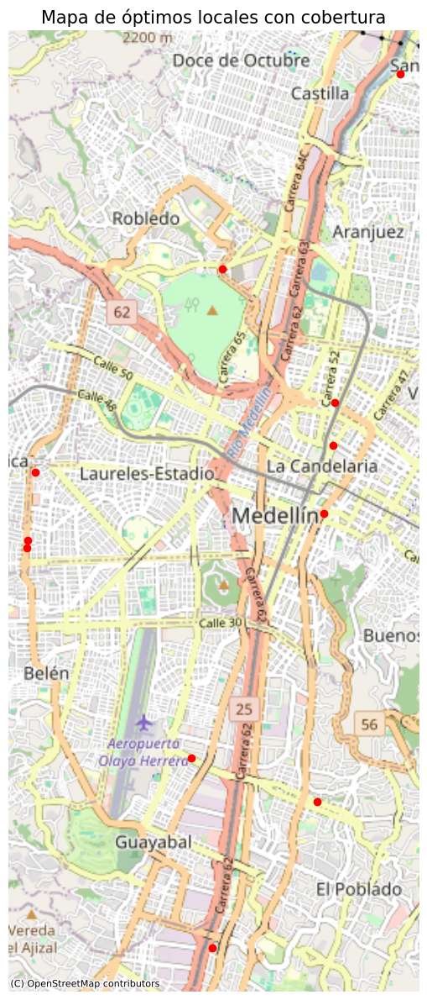

In [31]:
# ======================================
# MAPA DE UBICACIÓN DE LAS 11 FACILITIES
# ======================================
# Asumiendo que ya tienes gdf_map1 en EPSG:3857 y tus figuras creadas:
radius = 500  # radio en metros que quieras cubrir

# 1. Crea un GeoDataFrame con los buffers:
gdf_buffer = gdf_map1.to_crs(3857).copy()
gdf_buffer['geometry'] = gdf_buffer.geometry.buffer(radius)

# 2. Monta la figura y ejes
fig, ax = plt.subplots(figsize=(16, 12))

# # 3. Dibuja el buffer como círculo (transparente) antes o después:
# #    - facecolor con alpha para ver a través
# gdf_buffer.plot(ax=ax,
#                 facecolor='red',
#                 edgecolor='none',
#                 alpha=0.2,
#                 label=f'Cobertura {radius} m')

# 4. Dibuja tus rutas y puntos
# gdf_ar.to_crs(3857).plot(ax=ax,
#             color='blue',
#             label='Rutas')
gdf_map1.to_crs(3857).plot(ax=ax,
              color='red',
              label='Centros')

# 5. Añade el basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# 6. Ajustes finales
ax.set_title("Mapa de óptimos locales con cobertura", fontsize=15)
ax.set_axis_off()
plt.tight_layout()
plt.show()

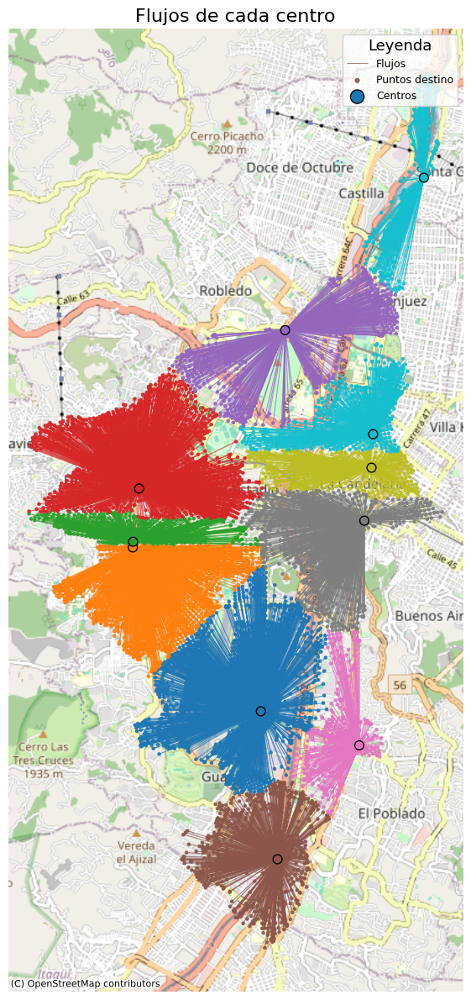

In [32]:
# ===================================================================
# MAPA DE NODOS DE ATENCIÓN DE LOS NODOS DE DEMANDA POR CADA FACILITY
# ===================================================================

# 0. (Carga tus datos)
# gdf_map1 = gpd.read_file("centros.shp")
# gdf_ar   = gpd.read_file("puntos.shp")

# 1. Reproyecta y resetea índices
gdf_centers = gdf_map1.to_crs(epsg=3857).reset_index(drop=True)
gdf_points  = gdf_ar  .to_crs(epsg=3857).reset_index(drop=True)

# 2. Marca cada centro con su propio índice como 'cluster'
gdf_centers['cluster'] = gdf_centers.index

# 3. Asigna a cada punto su centro más cercano (distancia Manhattan)
pts  = np.vstack([gdf_points.geometry.x, gdf_points.geometry.y]).T
cent = np.vstack([gdf_centers.geometry.x, gdf_centers.geometry.y]).T
dists   = np.abs(pts[:, None, :] - cent[None, :, :]).sum(axis=2)
closest = np.argmin(dists, axis=1)
gdf_points['cluster'] = closest

# 4. Genera las líneas de flujo
flow_records = []
for _, row in gdf_points.iterrows():
    cid       = row['cluster']
    center_pt = gdf_centers.loc[cid, 'geometry']
    flow      = LineString([center_pt, row.geometry])
    flow_records.append({'cluster': cid, 'geometry': flow})
flows = gpd.GeoDataFrame(flow_records, crs=gdf_points.crs)

# 5. Plot
fig, ax = plt.subplots(figsize=(16, 12))

# 5.1 Líneas de flujo
flows.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    linewidth=0.8,
    alpha=0.7,
    label='Flujos',    # etiqueta para la leyenda
    zorder=1
)

# 5.2 Puntos destino
gdf_points.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    markersize=5,
    alpha=0.9,
    label='Puntos destino',  # etiqueta para la leyenda
    zorder=2
)

# 5.3 Basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# 5.4 Puntos centrales encima de todo
gdf_centers.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    markersize=60,
    edgecolor='black',
    linewidth=1,
    label='Centros',   # etiqueta para la leyenda
    zorder=5
)

# 5.5 Leyenda y ajustes finales
ax.legend(
    title="Leyenda",
    loc='upper right',
    markerscale=1.5,
    fontsize=9,
    title_fontsize=13
)
ax.set_axis_off()
ax.set_title("Flujos de cada centro", fontsize=16)
plt.tight_layout()
plt.show()



## 4.3.2. MODELO DE OPTIMIZACIÓN MAXIMAL COVERING LOCATION PROBLEM CON DISTANCIA MANHATAN

In [34]:
# =============================================
# MODELO DE OPTIMIZACIÓN CON DISTANCIA MANHATAN
# =============================================

# ----------------------
# Conjunto de datos de demanda y localizaciones de facilities
# ----------------------
I_data = gdf_ar.index.to_list()
J_data = gdf_facr.index.to_list()

# -----------------------------
# Número P de facilities
# -----------------------------
p_value = 11
lamb = 1
budget = 1000

# -----------------------------------------------------
# Creación del modelo
# Maximal Covering Location Problem model
# -----------------------------------------------------
model = ConcreteModel(name="MCLP")

# Defino variables
model.I = Set(initialize=I_data)
model.J = Set(initialize=J_data)

# Defino los parámetros
model.a = Param(model.I, initialize=a_i_data, within=NonNegativeReals)
model.p = Param(initialize=p_value, within=NonNegativeIntegers)
model.w = Param(model.J, initialize=w_j_data, within=NonNegativeReals)
model.lamb = Param(initialize=lamb, within=NonNegativeIntegers)
model.c = Param(model.J, initialize=c_j_data, within=NonNegativeReals)
model.b = Param(initialize=budget, within=NonNegativeIntegers)

# Defino variables binarias
model.x = Var(model.J, within=Binary)
model.y = Var(model.I, within=Binary)

# Restricción de cobertura:
# Cada nodo i debe estar cubierto por al menos una facility en N_i
def coverage_rule(model, i):
    return model.y[i] + sum(model.x[j] for j in N_i_data_m[i]) >= 1
model.CoverageConstraint = Constraint(model.I, rule=coverage_rule)

# Restricción para el número de facilities
def facility_count_rule(model):
    return sum(model.x[j] for j in model.J) == model.p
model.FacilityConstraint = Constraint(rule=facility_count_rule)

# Restricción para el costo de la facility
def facility_cost(model):
    return sum(model.c[j] * model.x[j] for j in model.J) <= model.b
model.CostConstraint = Constraint(rule=facility_cost)

# Función objetivo
def obj_rule(model):
    return sum(model.a[i] * model.y[i] for i in model.I) - model.lamb * sum(model.w[j] * model.x[j] for j in model.J)
model.Obj = Objective(rule=obj_rule, sense=minimize)

In [35]:
# =====================
# RESULTADOS DEL MODELO
# =====================

# ---------------
# Mostrar la solución del modelo
# ---------------
solver = SolverFactory('glpk')
solver.solve(model, tee=True)

GLPSOL--GLPK LP/MIP Solver 5.0
Parameter(s) specified in the command line:
 --write /tmp/tmpd23cnwia.glpk.raw --wglp /tmp/tmp7_vsenw0.glpk.glp --cpxlp
 /tmp/tmp4hghpo9h.pyomo.lp
Reading problem data from '/tmp/tmp4hghpo9h.pyomo.lp'...
/tmp/tmp4hghpo9h.pyomo.lp:946624: warning: lower bound of variable 'x3302' redefined
/tmp/tmp4hghpo9h.pyomo.lp:946624: warning: upper bound of variable 'x3302' redefined
9965 rows, 10657 columns, 902763 non-zeros
10657 integer variables, all of which are binary
957281 lines were read
Writing problem data to '/tmp/tmp7_vsenw0.glpk.glp'...
936652 lines were written
GLPK Integer Optimizer 5.0
9965 rows, 10657 columns, 902763 non-zeros
10657 integer variables, all of which are binary
Preprocessing...
8 hidden packing inequaliti(es) were detected
9833 rows, 10525 columns, 902631 non-zeros
10525 integer variables, all of which are binary
Scaling...
 A: min|aij| =  1.000e+00  max|aij| =  9.000e+00  ratio =  9.000e+00
Problem data seem to be well scaled
Construct

{'Problem': [{'Name': 'unknown', 'Lower bound': 15.7142773432355, 'Upper bound': 15.7142773432355, 'Number of objectives': 1, 'Number of constraints': 9965, 'Number of variables': 10657, 'Number of nonzeros': 902763, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Termination condition': 'optimal', 'Statistics': {'Branch and bound': {'Number of bounded subproblems': '1', 'Number of created subproblems': '1'}}, 'Error rc': 0, 'Time': 13.390034675598145}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [36]:
# ==================================================
# VERIFICO LOS RESULTADOS DEL MODELO DE OPTIMIZACIÓN
# ==================================================

# Muestro las x_j
print("\nVariables x_j:")
for j in model.J:
    print(f"x[{j}] = {model.x[j].value}")

# Muestro las y_i
print("\nVariables y_i:")
for i in model.I:
    print(f"y[{i}] = {model.y[i].value}")

print("\nCobertura total =", model.Obj())


Variables x_j:
x[5135] = 0.0
x[5136] = 0.0
x[5134] = 0.0
x[5133] = 0.0
x[5132] = 0.0
x[5084] = 0.0
x[5328] = 0.0
x[5071] = 0.0
x[5314] = 0.0
x[5058] = 0.0
x[5285] = 0.0
x[5347] = 0.0
x[5299] = 0.0
x[5044] = 0.0
x[5231] = 0.0
x[5275] = 0.0
x[5419] = 0.0
x[5436] = 0.0
x[5217] = 0.0
x[5030] = 0.0
x[5245] = 0.0
x[5259] = 0.0
x[5202] = 0.0
x[5365] = 0.0
x[5014] = 0.0
x[5153] = 0.0
x[5169] = 0.0
x[5015] = 0.0
x[5201] = 0.0
x[5137] = 0.0
x[5168] = 0.0
x[4999] = 0.0
x[4986] = 0.0
x[4983] = 0.0
x[4984] = 0.0
x[4974] = 0.0
x[4948] = 0.0
x[4932] = 0.0
x[4969] = 0.0
x[4966] = 0.0
x[4901] = 0.0
x[5185] = 0.0
x[4964] = 0.0
x[4946] = 0.0
x[4945] = 0.0
x[4931] = 0.0
x[4926] = 0.0
x[4927] = 0.0
x[4888] = 0.0
x[4928] = 0.0
x[4886] = 0.0
x[4915] = 0.0
x[4917] = 0.0
x[4866] = 0.0
x[4865] = 0.0
x[4871] = 0.0
x[4872] = 0.0
x[4860] = 0.0
x[4854] = 0.0
x[4879] = 0.0
x[4875] = 0.0
x[4840] = 0.0
x[4877] = 0.0
x[4863] = 0.0
x[4862] = 0.0
x[4853] = 0.0
x[4831] = 0.0
x[4827] = 0.0
x[4802] = 0.0
x[4793] = 0.0
x[48

In [37]:
# ==============================
# ORGANIZACIÓN DE LOS RESULTADOS
# ==============================

# 1. Creo diccionarios de valores
x_vals = { j: model.x[j].value for j in model.J }
y_vals = { i: model.y[i].value for i in model.I }

# 2. Convierto en pandas.Series
x = pd.Series(x_vals, name="x")
y = pd.Series(y_vals, name="y")

# 3. Impromir resultados
print("\nVariables x_j:")
print(x)

print("\nVariables y_i:")
print(y)

print("\nCobertura total =", model.Obj())


Variables x_j:
5135    0.0
5136    0.0
5134    0.0
5133    0.0
5132    0.0
       ... 
452     0.0
453     0.0
422     0.0
514     0.0
485     0.0
Name: x, Length: 694, dtype: float64

Variables y_i:
14369    0.0
18667    0.0
32724    0.0
18659    0.0
18658    0.0
        ... 
15411    0.0
9455     0.0
9457     0.0
9467     0.0
9466     0.0
Name: y, Length: 9963, dtype: float64

Cobertura total = 15.714277343235516


In [38]:
# ======================================
# FORMATO DE RESULTADOS PARA HACER MAPAS
# ======================================

# Convierto a Dataframe
df_x = x.reset_index().rename(columns={"index":"j"})
df_y = y.reset_index().rename(columns={"index":"i"})

# Agrego resultados de las 11 ubicaciones al geodataframe de las ubicaciones factibles
gdf_map2 = gdf_facr.merge(
    df_x,
    left_index=True,    # usa el índice de gdf_facr
    right_on='j',       # con la columna j de df_x
    how='left'
)

# Filtro en aquellos cuya localización es un óptimo local
gdf_map3 = gdf_map2[gdf_map2['x']==1]

# Tranformo al CRS ESPG:3857 para efectos del mapa
gdf_map3 = gdf_map3.to_crs(3857)

# Veo la tabla con las 11 localizaciones de las facilities
gdf_map3

,MANZ_CCNCT,DPTO_CCDGO,MPIO_CCDGO,CLAS_CCDGO,CPOB_CCDGO,COD_SECC,COD_AG,SHAPE_Leng,SHAPE_Area,MANZ_CCDGO,...,file,año,mes,dia_semana,pesos,w,w_norm,distance,j,x
85,0500110000000015050211,05,05001,1,05001000,05001100000000150502,009655,0.007005,2.485358e-06,11,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,42,42,0.904762,8.939419,4828,1.0
201,0500110000000016030104,05,05001,1,05001000,05001100000000160301,009937,0.003994,4.303885e-07,04,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,153,153,0.900000,45.896625,5104,1.0
211,0500110000000011100407,05,05001,1,05001000,05001100000000111004,007244,0.005251,6.994545e-07,07,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,161,161,1.000000,107.737808,3068,1.0
212,0500110000000011110103,05,05001,1,05001000,05001100000000111101,007288,0.003463,6.659518e-07,03,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,3,159,0.975000,83.147410,3074,1.0
224,0500110000000010120110,05,05001,1,05001000,05001100000000101201,006465,0.002759,3.775147e-07,10,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,150,150,0.873418,9.038328,2548,1.0
332,0500110000000011150314,05,05001,1,05001000,05001100000000111503,012188,0.002567,4.156574e-07,14,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,146,146,0.469388,28.214769,3134,1.0
357,0500110000000005130147,05,05001,1,05001000,05001100000000051301,230936,0.005981,1.927198e-06,47,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,176,176,0.666667,24.908066,1067,1.0
376,0500110000000014240523,05,05001,1,05001000,05001100000000142405,009467,0.003956,9.883581e-07,23,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,54,54,1.000000,39.541607,4697,1.0
442,0500110000000014190401,05,05001,1,05001000,05001100000000141904,009352,0.004286,6.493297e-07,01,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,18,189,0.833333,11.847205,4291,1.0
566,0500110000000010050101,05,05001,1,05001000,05001100000000100501,006282,0.001903,2.146870e-07,01,...,Data EAFIT-Marzo-14-2023-AMVA.txt,2023,3,1,274,274,0.992701,10.718735,2190,1.0


In [39]:
# ======================================
# MAPA DE UBICACIÓN DE LAS 11 FACILITIES
# ======================================

gdf_map3.to_crs(3857).plot(ax=ax,
              color='red',
              label='Centros')

# 5. Añade el basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# 6. Ajustes finales
ax.set_title("Mapa de óptimos locales con cobertura", fontsize=15)
ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

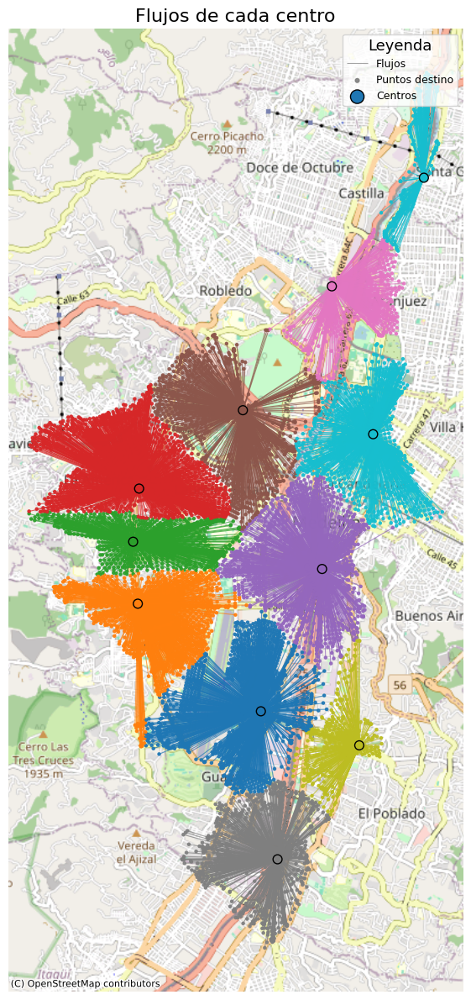

In [40]:
# ===================================================================
# MAPA DE NODOS DE ATENCIÓN DE LOS NODOS DE DEMANDA POR CADA FACILITY
# ===================================================================

# 0. (Carga tus datos)
# gdf_map1 = gpd.read_file("centros.shp")
# gdf_ar   = gpd.read_file("puntos.shp")

# 1. Reproyecta y resetea índices
gdf_centers = gdf_map3.to_crs(epsg=3857).reset_index(drop=True)
gdf_points  = gdf_ar  .to_crs(epsg=3857).reset_index(drop=True)

# 2. Marca cada centro con su propio índice como 'cluster'
gdf_centers['cluster'] = gdf_centers.index

# 3. Asigna a cada punto su centro más cercano (distancia Manhattan)
pts  = np.vstack([gdf_points.geometry.x, gdf_points.geometry.y]).T
cent = np.vstack([gdf_centers.geometry.x, gdf_centers.geometry.y]).T
dists   = np.abs(pts[:, None, :] - cent[None, :, :]).sum(axis=2)
closest = np.argmin(dists, axis=1)
gdf_points['cluster'] = closest

# 4. Genera las líneas de flujo
flow_records = []
for _, row in gdf_points.iterrows():
    cid       = row['cluster']
    center_pt = gdf_centers.loc[cid, 'geometry']
    flow      = LineString([center_pt, row.geometry])
    flow_records.append({'cluster': cid, 'geometry': flow})
flows = gpd.GeoDataFrame(flow_records, crs=gdf_points.crs)

# 5. Plot
fig, ax = plt.subplots(figsize=(16, 12))

# 5.1 Líneas de flujo
flows.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    linewidth=0.8,
    alpha=0.7,
    label='Flujos',    # etiqueta para la leyenda
    zorder=1
)

# 5.2 Puntos destino
gdf_points.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    markersize=5,
    alpha=0.9,
    label='Puntos destino',  # etiqueta para la leyenda
    zorder=2
)

# 5.3 Basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# 5.4 Puntos centrales encima de todo
gdf_centers.plot(
    ax=ax,
    column='cluster',
    cmap='tab10',
    markersize=60,
    edgecolor='black',
    linewidth=1,
    label='Centros',   # etiqueta para la leyenda
    zorder=5
)

# 5.5 Leyenda y ajustes finales
ax.legend(
    title="Leyenda",
    loc='upper right',
    markerscale=1.5,
    fontsize=9,
    title_fontsize=13
)
ax.set_axis_off()
ax.set_title("Flujos de cada centro", fontsize=16)
plt.tight_layout()
plt.show()

# Conclusiones futuras

- Usar distancias por la malla vial.
- Mejorar el modelo teniendo en cuenta el costo de las manzanas y el presupuesto.
- Explorar otros modelos de optimización.